<a href="https://colab.research.google.com/github/jacobgreen4477/TDWI/blob/master/dacon_toss_v0_0_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

> title : 토스 NEXT ML CHALLENGE : 광고 클릭 예측(CTR) 모델 개발 <br>
> author : hjy <br>

### data info
- gender : 성별
  - 1:남성, 2:여성

- age_group : 연령 그룹
  - 8:10대, 7:20대, 6:30대, 5:40대

- inventory_id : 지면 ID
- day_of_week : 주번호
- hour : 시간
- seq : 유저 서버 로그 시퀀스
- l_feat_* : 속성 정보 피처 (l_feat_14는 Ads set)
- feat_e_* : 정보영역 e 피처 (광고지면관련정보)
- feat_d_* : 정보영역 d 피처 (광고지면관련정보)
- feat_c_* : 정보영역 c 피처 (광고지면관련정보)
- feat_b_* : 정보영역 b 피처 (광고지면관련정보)
- feat_a_* : 정보영역 a 피처 (광고지면관련정보)
- history_a_* : 과거 인기도 피처 (상품에 대한 과거 인기도 인듯..)
- clicked : 클릭 여부 (Label)

### libarary

In [1]:
import pandas as pd
import numpy as np
import os, random
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option("display.max_rows", 999)      # 모든 행
pd.set_option("display.max_columns", 999)   # 모든 열
pd.set_option("display.width", None)         # 가로 폭 제한 해제
pd.set_option("display.max_colwidth", None)  # 문자열 잘림 해제

In [3]:
CFG = {
    'BATCH_SIZE': 1024,
    'EPOCHS': 5,
    'LEARNING_RATE': 1e-3,
    'SEED': 42
}

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(CFG['SEED'])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

Device: cuda


In [4]:
class ClickDataset(Dataset):
    def __init__(self, df, num_cols, cat_cols, seq_col, target_col=None, has_target=True):
        self.df = df.reset_index(drop=True)
        self.num_cols = num_cols
        self.cat_cols = cat_cols
        self.seq_col = seq_col
        self.target_col = target_col
        self.has_target = has_target
        self.num_X = self.df[self.num_cols].astype(float).fillna(0).values
        self.cat_X = self.df[self.cat_cols].astype(int).values
        self.seq_strings = self.df[self.seq_col].astype(str).values
        if self.has_target:
            self.y = self.df[self.target_col].astype(np.float32).values

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        num_x = torch.tensor(self.num_X[idx], dtype=torch.float)
        cat_x = torch.tensor(self.cat_X[idx], dtype=torch.long)
        s = self.seq_strings[idx]
        if s:
            arr = np.fromstring(s, sep=",", dtype=np.float32)
        else:
            arr = np.array([0.0], dtype=np.float32)
        seq = torch.from_numpy(arr)
        if self.has_target:
            y = torch.tensor(self.y[idx], dtype=torch.float)
            return num_x, cat_x, seq, y
        else:
            return num_x, cat_x, seq

def collate_fn_train(batch):
    num_x, cat_x, seqs, ys = zip(*batch)
    num_x = torch.stack(num_x)
    cat_x = torch.stack(cat_x)
    ys = torch.stack(ys)
    seqs_padded = nn.utils.rnn.pad_sequence(seqs, batch_first=True, padding_value=0.0)
    seq_lengths = torch.tensor([len(s) for s in seqs], dtype=torch.long)
    seq_lengths = torch.clamp(seq_lengths, min=1)
    return num_x, cat_x, seqs_padded, seq_lengths, ys

def collate_fn_infer(batch):
    num_x, cat_x, seqs = zip(*batch)
    num_x = torch.stack(num_x)
    cat_x = torch.stack(cat_x)
    seqs_padded = nn.utils.rnn.pad_sequence(seqs, batch_first=True, padding_value=0.0)
    seq_lengths = torch.tensor([len(s) for s in seqs], dtype=torch.long)
    seq_lengths = torch.clamp(seq_lengths, min=1)
    return num_x, cat_x, seqs_padded, seq_lengths

class CrossNetwork(nn.Module):
    def __init__(self, input_dim, num_layers=2):
        super().__init__()
        self.layers = nn.ModuleList([
            nn.Linear(input_dim, 1, bias=True) for _ in range(num_layers)
        ])

    def forward(self, x0):
        x = x0
        for w in self.layers:
            x = x0 * w(x) + x
        return x

class WideDeepCTR(nn.Module):
    def __init__(self, num_features, cat_cardinalities, emb_dim=16, lstm_hidden=64,
                 hidden_units=[512,256,128], dropout=[0.1,0.2,0.3]):
        super().__init__()
        self.emb_layers = nn.ModuleList([
            nn.Embedding(cardinality, emb_dim) for cardinality in cat_cardinalities
        ])
        cat_input_dim = emb_dim * len(cat_cardinalities)
        self.bn_num = nn.BatchNorm1d(num_features)
        self.lstm = nn.LSTM(input_size=1, hidden_size=lstm_hidden,
                            num_layers=2, batch_first=True, bidirectional=True)
        seq_out_dim = lstm_hidden * 2
        self.cross = CrossNetwork(num_features + cat_input_dim + seq_out_dim, num_layers=2)
        input_dim = num_features + cat_input_dim + seq_out_dim
        layers = []
        for i, h in enumerate(hidden_units):
            layers += [nn.Linear(input_dim, h), nn.ReLU(), nn.Dropout(dropout[i % len(dropout)])]
            input_dim = h
        layers += [nn.Linear(input_dim, 1)]
        self.mlp = nn.Sequential(*layers)

    def forward(self, num_x, cat_x, seqs, seq_lengths):
        num_x = self.bn_num(num_x)
        cat_embs = [emb(cat_x[:, i]) for i, emb in enumerate(self.emb_layers)]
        cat_feat = torch.cat(cat_embs, dim=1)
        seqs = seqs.unsqueeze(-1)
        packed = nn.utils.rnn.pack_padded_sequence(seqs, seq_lengths.cpu(),
                                                   batch_first=True, enforce_sorted=False)
        _, (h_n, _) = self.lstm(packed)
        h = torch.cat([h_n[-2], h_n[-1]], dim=1)
        z = torch.cat([num_x, cat_feat, h], dim=1)
        z_cross = self.cross(z)
        out = self.mlp(z_cross)
        return out.squeeze(1)

def train_model(train_df, num_cols, cat_cols, seq_col, target_col, batch_size, epochs, lr, device):
    train_dataset = ClickDataset(train_df, num_cols, cat_cols, seq_col, target_col, True)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True,
                              collate_fn=collate_fn_train, pin_memory=True)
    cat_cardinalities = [len(cat_encoders[c].classes_) for c in cat_cols]
    model = WideDeepCTR(
        num_features=len(num_cols),
        cat_cardinalities=cat_cardinalities,
        emb_dim=16,
        lstm_hidden=64,
        hidden_units=[512,256,128],
        dropout=[0.1,0.2,0.3]
    ).to(device)
    pos_weight_value = (len(train_df) - train_df[target_col].sum()) / train_df[target_col].sum()
    pos_weight = torch.tensor([pos_weight_value], dtype=torch.float).to(device)
    criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=2, T_mult=2)
    print("학습 시작")
    for epoch in range(1, epochs+1):
        model.train()
        total_loss = 0
        for num_x, cat_x, seqs, lens, ys in tqdm(train_loader, desc=f"[Train Epoch {epoch}]"):
            num_x, cat_x, seqs, lens, ys = num_x.to(device), cat_x.to(device), seqs.to(device), lens.to(device), ys.to(device)
            optimizer.zero_grad()
            logits = model(num_x, cat_x, seqs, lens)
            loss = criterion(logits, ys)
            loss.backward()
            optimizer.step()
            scheduler.step()
            total_loss += loss.item() * ys.size(0)
        total_loss /= len(train_dataset)
        print(f"[Epoch {epoch}] Train Loss: {total_loss:.4f}")
        if torch.cuda.is_available():
            print(f"[DEBUG] GPU Allocated: {torch.cuda.memory_allocated()/1024**2:.2f} MB")
    print("학습 완료")
    return model

In [5]:
def encode_categoricals(train_df, test_df, cat_cols):
    encoders = {}
    for col in cat_cols:
        le = LabelEncoder()
        all_values = pd.concat([train_df[col], test_df[col]], axis=0).astype(str).fillna("UNK")
        le.fit(all_values)
        train_df[col] = le.transform(train_df[col].astype(str).fillna("UNK"))
        test_df[col]  = le.transform(test_df[col].astype(str).fillna("UNK"))
        encoders[col] = le
        print(f"{col} unique categories: {len(le.classes_)}")
    return train_df, test_df, encoders

#### plot_bar_line

In [6]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_bar_line(df, group_col, target_col, figsize=(6,4), title=None):

    # 그룹별 개수 ----------------------------------------------------------
    a1 = df[group_col].value_counts().reset_index()
    a1.columns = [group_col, 'count']

    # 그룹별 평균 ----------------------------------------------------------
    a2 = df.groupby(group_col)[target_col].mean().reset_index()
    a2.columns = [group_col, 'mean_target']

    # 정렬 (group_col이 숫자 또는 정렬 가능한 경우) ------------------------
    try:
        a1 = a1.sort_values(group_col)
        a2 = a2.sort_values(group_col)
    except Exception:
        pass  # 정렬 불가능한 경우 그대로 둠

    # 그래프 ---------------------------------------------------------------
    fig, ax1 = plt.subplots(figsize=figsize)

    ax1.bar(a1[group_col], a1['count'],
            color='skyblue', alpha=0.6)     # bar plot (count)
    ax1.set_ylabel('Count')
    ax1.set_xlabel(group_col)

    ax2 = ax1.twinx()
    ax2.plot(a2[group_col], a2['mean_target'],
             color='grey', marker='o', label=f'Mean {target_col}')   # line plot (mean target)
    ax2.set_ylabel(f'Mean {target_col}')

    # 제목 ----------------------------------------------------------------
    if title is None:
        title = f'{group_col} vs {target_col}'
    fig.suptitle(title)

    plt.show()

### read data

In [7]:
from google.colab import drive, files
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
%%time

# CPU times: user 2min 28s, sys: 2min 16s, total: 4min 44s
# Wall time: 5min 17s

print("데이터 로드 시작")
train = pd.read_parquet("/content/drive/MyDrive/toss/train.parquet", engine="pyarrow")
test = pd.read_parquet("/content/drive/MyDrive/toss/test.parquet", engine="pyarrow")
print(f"Train shape: {train.shape}")
print(f"Test shape: {test.shape}")
print("데이터 로드 완료")

데이터 로드 시작
Train shape: (10704179, 119)
Test shape: (1527298, 119)
데이터 로드 완료
CPU times: user 1min 18s, sys: 54.3 s, total: 2min 12s
Wall time: 2min 13s


### sampling

In [9]:
# seq : 유저 서버 로그 시퀀스
train.head(1)

,gender,age_group,inventory_id,day_of_week,hour,seq,l_feat_1,l_feat_2,l_feat_3,l_feat_4,l_feat_5,l_feat_6,l_feat_7,l_feat_8,l_feat_9,l_feat_10,l_feat_11,l_feat_12,l_feat_13,l_feat_14,l_feat_15,l_feat_16,l_feat_17,l_feat_18,l_feat_19,l_feat_20,l_feat_21,l_feat_22,l_feat_23,l_feat_24,l_feat_25,l_feat_26,l_feat_27,feat_e_1,feat_e_2,feat_e_3,feat_e_4,feat_e_5,feat_e_6,feat_e_7,feat_e_8,feat_e_9,feat_e_10,feat_d_1,feat_d_2,feat_d_3,feat_d_4,feat_d_5,feat_d_6,feat_c_1,feat_c_2,feat_c_3,feat_c_4,feat_c_5,feat_c_6,feat_c_7,feat_c_8,feat_b_1,feat_b_2,feat_b_3,feat_b_4,feat_b_5,feat_b_6,feat_a_1,feat_a_2,feat_a_3,feat_a_4,feat_a_5,feat_a_6,feat_a_7,feat_a_8,feat_a_9,feat_a_10,feat_a_11,feat_a_12,feat_a_13,feat_a_14,feat_a_15,feat_a_16,feat_a_17,feat_a_18,history_a_1,history_a_2,history_a_3,history_a_4,history_a_5,history_a_6,history_a_7,history_b_1,history_b_2,history_b_3,history_b_4,history_b_5,history_b_6,history_b_7,history_b_8,history_b_9,history_b_10,history_b_11,history_b_12,history_b_13,history_b_14,history_b_15,history_b_16,history_b_17,history_b_18,history_b_19,history_b_20,history_b_21,history_b_22,history_b_23,history_b_24,history_b_25,history_b_26,history_b_27,history_b_28,history_b_29,history_b_30,clicked
0,1.0,7.0,36,5,13,"9,18,269,516,57,97,527,74,317,311,269,479,57,74,317,77,58,58,540,269,300,479,57,58,58,74,77,318,479,35,57,516,97,479,35,57,516,97,417,227,35,479,57,97,516,74,318,452,207,51,269,508,452,370,51,245,508,207,269,51,269,245,508,207,51,508,269,51,49,269,508,207,51,269,508,207,51,508,269,207,74,318,77,212,463,193,151,331,269,470,463,463,193,506,331,269,470,463,193,74,35,479,57,74,77,317,306,479,57,390,269,40,306,74,77,317,544,269,311,479,35,57,516,97,527,74,318,77,317,269,479,311,57,74,317,58,540,269,300,479,57,58,74,317,79,74,116,134,292,97,356,447,479,57,116,134,74,317,74,134,116,269,242,74,77,317,469,479,57,316,479,57,316,479,57,316,74,77,317,269,75,15,483,75,269,15,269,483,75,452,207,51,479,57,479,57,49,269,508,207,450,74,77,317,74,452,207,74,417,227,132,138,101,434,101,41,101,101,132,101,101,101,132,101,497,101,274,140,274,101,101,101,140,447,101,274,479,57,140,447,274,101,279,408,408,408,108,408,408,511,279,408,108,408,408,408,511,101,408,274,408,279,108,408,116,134,116,134,274,101,101,274,101,274,101,274,140,101,132,101,497,101,132,227,35,479,516,57,97,417,227,138,101,132,101,101,497,132,101,140,447,292,79,101,274,140,447,101,274,140,101,101,216,101,140,132,101,101,497,132,101,140,140,132,101,227,74,527,207,452,51,269,508,207,269,51,508,207,51,49,269,508,207,508,51,269,207,269,51,508,207,74,77,318,193,463,74,77,317,469,479,57,316,74,77,317,74,317,279,408,408,408,408,408,408,408,408,408,408,408,498,408,408,498,408,408,408,408,408,408,408,408,269,408,408,408,408,408,408,269,408,408,511,408,408,408,408,279,408,408,498,408,74,317,408,408,408,408,269,511,154,408,408,408,408,408,408,269,154,479,57,408,408,408,408,154,269,408,479,408,57,408,408,408,154,269,408,479,57,408,408,408,408,408,408,269,479,154,57,408,408,408,408,408,154,269,408,479,57,408,408,408,408,408,269,408,154,479,408,57,408,408,408,498,408,279,498,408,408,74,108,317,74,77,317,480,480,282,99,479,57,480,282,479,57,282,480,479,57,235,269,480,479,57,235,269,480,479,57,480,235,269,479,57,480,269,282,235,99,479,57,480,74,317,480,99,479,57,480,235,269,282,74,317,74,77,318,207,452,51,207,74,318,77,317,544,311,269,479,57,74,77,317,544,544,74,77,227,417,101,132,101,497,132,101,101,532,140,447,274,101,140,132,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,532,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,370,101,132,101,532,227,74,527,317,74,35,479,57,516,97,227,417,132,101,138,101,132,497,101,140,447,79,292,274,101,447,356,274,101,101,132,227,527,74,318,77,452,207,51,479,57,479,57,49,508,269,207,74,31

In [10]:
def sample_valid_by_distribution(train, test, features, valid_size=0.2, random_state=42):

    n_train = len(train)
    tgt_valid_n = int(round(n_train * valid_size))

    # 1) test에서 그룹 분포(p) 계산
    test_cnt = (test
                .groupby(features, dropna=False)
                .size()
                .rename('test_cnt')
                .reset_index())
    test_cnt['test_p'] = test_cnt['test_cnt'] / test_cnt['test_cnt'].sum()
    test_cnt = test_cnt.drop(columns='test_cnt')

    # 2) train에서 그룹 사이즈 계산
    train_sz = (train
                .groupby(features, dropna=False)
                .size()
                .rename('train_sz')
                .reset_index())

    # 3) 그룹 단위로 병합하여 목표 샘플 수 계산
    meta = train_sz.merge(test_cnt, on=features, how='left')
    meta['test_p'] = meta['test_p'].fillna(0.0)

    meta['target_n'] = np.floor(tgt_valid_n * meta['test_p'] + 0.5).astype(int)
    meta['target_n'] = meta[['target_n', 'train_sz']].min(axis=1)

    diff = tgt_valid_n - meta['target_n'].sum()
    if diff != 0 and len(meta) > 0:
        order = meta['test_p'].to_numpy()
        idxs = np.argsort(order)[::-1] if diff > 0 else np.argsort(order)
        i = 0
        while diff != 0 and i < len(idxs):
            j = idxs[i]
            if diff > 0 and meta.at[j, 'target_n'] < meta.at[j, 'train_sz']:
                meta.at[j, 'target_n'] += 1
                diff -= 1
            elif diff < 0 and meta.at[j, 'target_n'] > 0:
                meta.at[j, 'target_n'] -= 1
                diff += 1
            else:
                i += 1

    meta['threshold'] = (meta['target_n'] / meta['train_sz']).fillna(0.0)

    train_key = train[features]
    meta_key = meta[features + ['threshold']]
    train_with_thr = train_key.merge(meta_key, on=features, how='left')
    thr = train_with_thr['threshold'].fillna(0.0).to_numpy()

    rng = np.random.default_rng(random_state)
    u = rng.random(n_train)
    pick = u < thr

    valid_new = train.loc[pick].copy()
    train_new = train.loc[~pick].copy()

    # 🔹 valid_new를 day_of_week == 7 로 제한
    if 'day_of_week' in train.columns:
        valid_new = valid_new[valid_new['day_of_week'] == '7']

    return train_new, valid_new

In [11]:
%%time

import gc
gc.collect()

features = ['gender','age_group','hour'] # seq, day_of_week

train2, valid = sample_valid_by_distribution(
    train=train,
    test=test,
    features=features,
    valid_size=0.2,
    random_state=42
)

# check
print(train2.shape)
print(valid.shape)
print(test.shape)

(8563790, 119)
(308424, 119)
(1527298, 119)
CPU times: user 11.5 s, sys: 3.13 s, total: 14.6 s
Wall time: 14.6 s


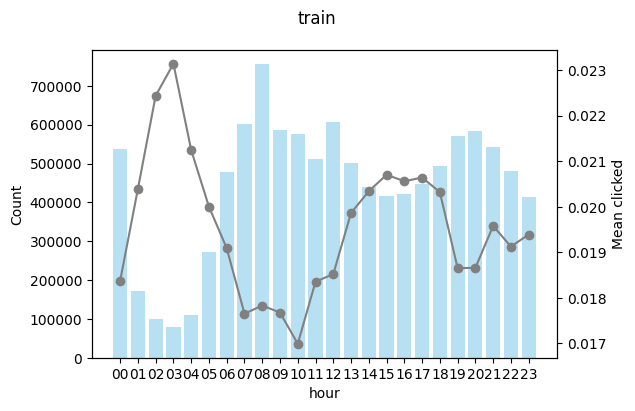

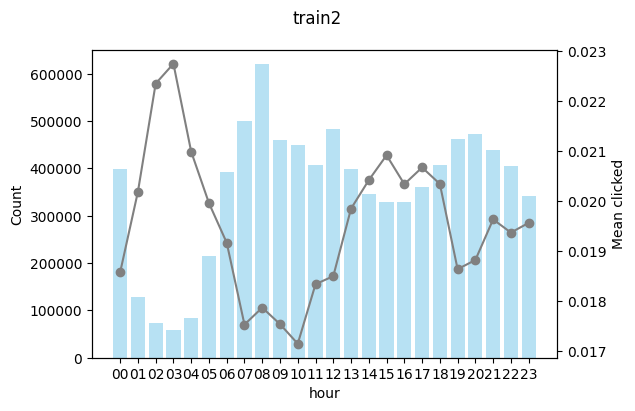

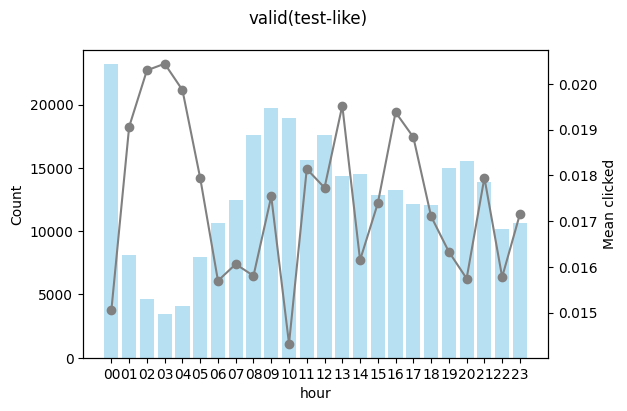

In [12]:
plot_bar_line(train, group_col='hour', target_col='clicked',title='train')
plot_bar_line(train2, group_col='hour', target_col='clicked',title='train2')
plot_bar_line(valid, group_col='hour', target_col='clicked',title='valid(test-like)')

In [13]:
test['day_of_week'].value_counts()

,count
day_of_week,
7,1527298


### feature engineering

In [14]:
"""
sudoID1 : 성별-연령-시간-seq
sudoID1 : 성별-연령-시간-주번호-seq
sudoID1 : 성별-연령-시간--seq
----------------------------------------------------------
gender : 성별
age_group : 연령 그룹
inventory_id : 지면 ID
day_of_week : 주번호
hour : 시간
seq : 유저 서버 로그 시퀀스
l_feat_* : 속성 정보 피처 (l_feat_14는 Ads set) # 광고세트정보
feat_e_* : 정보영역 e 피처
feat_d_* : 정보영역 d 피처
feat_c_* : 정보영역 c 피처
feat_b_* : 정보영역 b 피처
feat_a_* : 정보영역 a 피처
history_a_* : 과거 인기도 피처
clicked : 클릭 여부 (Label)
"""
train2[[i for i in train2.columns.tolist() if i not in ['seq']]].head(1)

,gender,age_group,inventory_id,day_of_week,hour,l_feat_1,l_feat_2,l_feat_3,l_feat_4,l_feat_5,l_feat_6,l_feat_7,l_feat_8,l_feat_9,l_feat_10,l_feat_11,l_feat_12,l_feat_13,l_feat_14,l_feat_15,l_feat_16,l_feat_17,l_feat_18,l_feat_19,l_feat_20,l_feat_21,l_feat_22,l_feat_23,l_feat_24,l_feat_25,l_feat_26,l_feat_27,feat_e_1,feat_e_2,feat_e_3,feat_e_4,feat_e_5,feat_e_6,feat_e_7,feat_e_8,feat_e_9,feat_e_10,feat_d_1,feat_d_2,feat_d_3,feat_d_4,feat_d_5,feat_d_6,feat_c_1,feat_c_2,feat_c_3,feat_c_4,feat_c_5,feat_c_6,feat_c_7,feat_c_8,feat_b_1,feat_b_2,feat_b_3,feat_b_4,feat_b_5,feat_b_6,feat_a_1,feat_a_2,feat_a_3,feat_a_4,feat_a_5,feat_a_6,feat_a_7,feat_a_8,feat_a_9,feat_a_10,feat_a_11,feat_a_12,feat_a_13,feat_a_14,feat_a_15,feat_a_16,feat_a_17,feat_a_18,history_a_1,history_a_2,history_a_3,history_a_4,history_a_5,history_a_6,history_a_7,history_b_1,history_b_2,history_b_3,history_b_4,history_b_5,history_b_6,history_b_7,history_b_8,history_b_9,history_b_10,history_b_11,history_b_12,history_b_13,history_b_14,history_b_15,history_b_16,history_b_17,history_b_18,history_b_19,history_b_20,history_b_21,history_b_22,history_b_23,history_b_24,history_b_25,history_b_26,history_b_27,history_b_28,history_b_29,history_b_30,clicked
0,1.0,7.0,36,5,13,1.0,2.0,1.0,23.0,1.0,1.0,193.0,2.0,50.0,118.0,743.0,2877.0,2.0,1591.0,1058.0,2.0,50.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,5.0,2.0,65.0,-4230.666504,23.863636,-0.05,0.019608,-0.012987,0.625,-242.488892,-0.612903,-436.228577,0.38961,2.0,1.764706,1.444444,-0.30303,-0.422535,58.840435,0.043634,66.696426,28.672052,45.806812,7.606154,73.891685,26.482759,4.845361,-4.337349,47.611111,0.907216,-75.421051,1961.083374,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.4727,0.0,0.0,0.0,0.0,0.032765,-0.055556,0.02439,-326.857147,-0.014493,-183.285721,-13.596154,0.115821,0.138626,0.047507,0.050622,0.026479,0.001558,0.024922,0.051401,0.004673,0.021028,0.072428,0.007009,0.028816,0.05841,0.000779,0.072428,0.016355,0.011682,0.010124,0.002336,0.008567,0.070092,0.070092,0.011682,0.004673,0.087226,0.049843,0.015576,0.040498,0.051401,0


In [15]:
train2['sudoid'] = train2['gender'].astype(str) + ':' + \
                   train2['age_group'].astype(str) + ':' + \
                   train2['hour'].astype(str)

#### seq

In [16]:
train2[['sudoid','clicked','seq']]

,sudoid,clicked,seq
0,1.0:7.0:13,0,"9,18,269,516,57,97,527,74,317,311,269,479,57,74,317,77,58,58,540,269,300,479,57,58,58,74,77,318,479,35,57,516,97,479,35,57,516,97,417,227,35,479,57,97,516,74,318,452,207,51,269,508,452,370,51,245,508,207,269,51,269,245,508,207,51,508,269,51,49,269,508,207,51,269,508,207,51,508,269,207,74,318,77,212,463,193,151,331,269,470,463,463,193,506,331,269,470,463,193,74,35,479,57,74,77,317,306,479,57,390,269,40,306,74,77,317,544,269,311,479,35,57,516,97,527,74,318,77,317,269,479,311,57,74,317,58,540,269,300,479,57,58,74,317,79,74,116,134,292,97,356,447,479,57,116,134,74,317,74,134,116,269,242,74,77,317,469,479,57,316,479,57,316,479,57,316,74,77,317,269,75,15,483,75,269,15,269,483,75,452,207,51,479,57,479,57,49,269,508,207,450,74,77,317,74,452,207,74,417,227,132,138,101,434,101,41,101,101,132,101,101,101,132,101,497,101,274,140,274,101,101,101,140,447,101,274,479,57,140,447,274,101,279,408,408,408,108,408,408,511,279,408,108,408,408,408,511,101,408,274,408,279,108,408,116,134,116,134,274,101,101,274,101,274,101,274,140,101,132,101,497,101,132,227,35,479,516,57,97,417,227,138,101,132,101,101,497,132,101,140,447,292,79,101,274,140,447,101,274,140,101,101,216,101,140,132,101,101,497,132,101,140,140,132,101,227,74,527,207,452,51,269,508,207,269,51,508,207,51,49,269,508,207,508,51,269,207,269,51,508,207,74,77,318,193,463,74,77,317,469,479,57,316,74,77,317,74,317,279,408,408,408,408,408,408,408,408,408,408,408,498,408,408,498,408,408,408,408,408,408,408,408,269,408,408,408,408,408,408,269,408,408,511,408,408,408,408,279,408,408,498,408,74,317,408,408,408,408,269,511,154,408,408,408,408,408,408,269,154,479,57,408,408,408,408,154,269,408,479,408,57,408,408,408,154,269,408,479,57,408,408,408,408,408,408,269,479,154,57,408,408,408,408,408,154,269,408,479,57,408,408,408,408,408,269,408,154,479,408,57,408,408,408,498,408,279,498,408,408,74,108,317,74,77,317,480,480,282,99,479,57,480,282,479,57,282,480,479,57,235,269,480,479,57,235,269,480,479,57,480,235,269,479,57,480,269,282,235,99,479,57,480,74,317,480,99,479,57,480,235,269,282,74,317,74,77,318,207,452,51,207,74,318,77,317,544,311,269,479,57,74,77,317,544,544,74,77,227,417,101,132,101,497,132,101,101,532,140,447,274,101,140,132,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,532,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,101,370,101,132,101,532,227,74,527,317,74,35,479,57,516,97,227,417,132,101,138,101,132,497,101,140,447,79,292,274,101,447,356,274,101,101,132,227,527,74,318,77,452,207,51,479,57,479,57,49,508,269,207,74,318,77,193,463,74,318,77,317,469,479,57,316,74,77,317,480,74,317,74,116,134,269,242,447,356,116,134,447,356,447,447,116,134,74,479,35,57,516,227,97,417,132,101,138,101,497,101,132,101,140,447,79,292,274,101,101,132,140,447,101,274,132,101,227,527,74,318,77,207,452,207,51,74,77,317,408,408,408,154,408,269,479,408,57,408,408,269,408,154,408,479,57,408,408,408,498,408,279,108,74,408,318,77,35,479,516,57,97,527,74,77,318,317,469,316,479,57,316,74,77,317,74,79,417,227,138,132,101,101,101,140,447,292,274,101,447,101,274,101,132,532,227,74,527,35,479,57,516,227,417,97,138,132,101,101,132,101,497,140,292,447,79,447,274,101,101,132,227,527,74,318,193,463,151,331,151,269,470,463,193,463,193,506,331,269,470,463,193,74,35,479,57,74,77,318,317,469,479,57,316,74,77,317,480,282,479,57,480,282,99,479,57,235,480,269,74,77,317,74,317,74,134,116,97,74,479,35,57,516,97,227,417,138,101,132,356,79,447,292,274,101,132,101,227,74,527,318,77,452,207,51,84,207,74,318,77,317,469,479,57,316,74,77,317,74,317,408,408,269,408,154,408,342,408,408,408,408,279,408,408,108,408,74,317,269,311,479,57,74,416,338,479,35"
1,1.0:7.0:08,0,"9,144,269,57,516,97,527,74,315,317,311,269,479,57,74,315,317,58,58,540,269,479,300,57,58,58,74,31

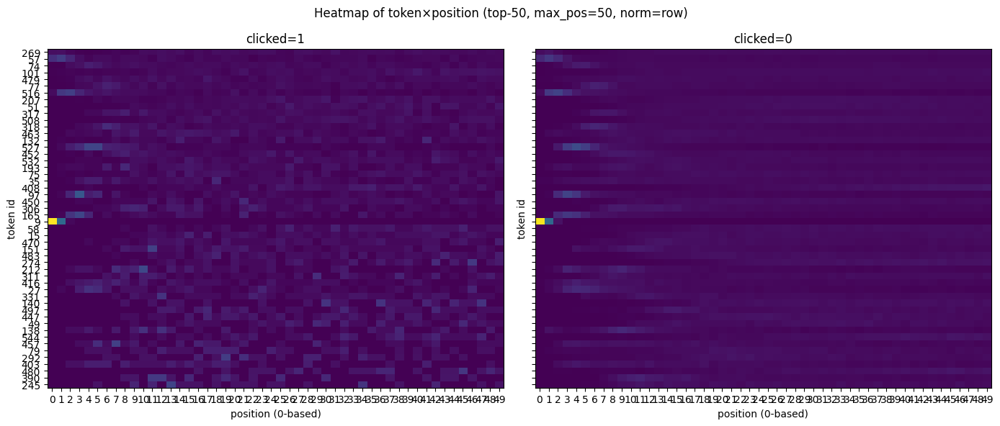

In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_seq_heatmaps(
    df,
    seq_col='seq',
    target_col='clicked',
    top_k=50,         # 전역 빈도 상위 토큰만 사용
    max_pos=100,      # 시각화할 최대 포지션(0부터)
    figsize=(14, 6),
    normalize='row'   # None / 'row' / 'col' / 'all'
):
    """
    seq: '269,57,516,...' 형식 문자열
    clicked 별로 (토큰 x 포지션) 빈도 히트맵 비교

    normalize:
      - None : raw counts
      - 'row': 토큰(행) 기준 정규화
      - 'col': 포지션(열) 기준 정규화
      - 'all': 전체 합 1로 정규화
    """

    # --- 1) explode (빠르고 견고하게) ---
    tmp = df[[target_col, seq_col]].copy()
    tmp['__rowid__'] = np.arange(len(tmp))
    # 문자열 -> 리스트
    tmp[seq_col] = tmp[seq_col].astype(str).str.strip().str.split(',')
    # explode
    ex = tmp.explode(seq_col, ignore_index=False)
    ex = ex.dropna(subset=[seq_col])
    ex[seq_col] = ex[seq_col].astype(str).str.strip()
    ex = ex[ex[seq_col] != '']

    # 숫자 아닌 값 안전 변환
    ex[seq_col] = pd.to_numeric(ex[seq_col], errors='coerce')
    ex = ex.dropna(subset=[seq_col])
    ex[seq_col] = ex[seq_col].astype(int)

    # 포지션 부여 (원행 기준 누적 인덱스)
    ex['pos'] = ex.groupby('__rowid__').cumcount()
    ex = ex[ex['pos'] < max_pos]  # 너무 긴 시퀀스는 잘라서 그림

    # --- 2) 전역 상위 토큰 top_k 선택 (두 그룹 동일 기준) ---
    global_tokens = (ex.groupby(seq_col).size()
                       .sort_values(ascending=False)
                       .head(top_k)
                       .index.tolist())
    ex = ex[ex[seq_col].isin(global_tokens)]

    # 토큰 정렬(빈도 내림차순)
    token_order = global_tokens

    # --- 3) 피벗 함수 ---
    def build_mat(sub):
        mat = (sub
               .groupby([seq_col, 'pos'])
               .size()
               .rename('cnt')
               .reset_index()
               .pivot(index=seq_col, columns='pos', values='cnt')
               .reindex(index=token_order))
        mat = mat.fillna(0)
        # 정규화 옵션
        if normalize == 'row':
            mat = mat.div(mat.sum(axis=1).replace(0, np.nan), axis=0).fillna(0)
        elif normalize == 'col':
            mat = mat.div(mat.sum(axis=0).replace(0, np.nan), axis=1).fillna(0)
        elif normalize == 'all':
            s = mat.values.sum()
            if s > 0: mat = mat / s
        return mat

    mat1 = build_mat(ex[ex[target_col] == 1])
    mat0 = build_mat(ex[ex[target_col] == 0])

    # 두 행렬의 컬러 스케일을 동일하게(비교 용이)
    vmin = min(mat0.values.min(), mat1.values.min())
    vmax = max(mat0.values.max(), mat1.values.max())

    # --- 4) 플롯 ---
    fig, axes = plt.subplots(1, 2, figsize=figsize, sharex=True, sharey=True)
    for ax, mat, title in zip(
        axes,
        [mat1, mat0],
        [f'{target_col}=1', f'{target_col}=0']
    ):
        im = ax.imshow(mat.values, aspect='auto', vmin=vmin, vmax=vmax)
        ax.set_title(title)
        ax.set_xlabel('position (0-based)')
        ax.set_ylabel('token id')
        # 축 라벨
        ax.set_yticks(np.arange(len(token_order)))
        ax.set_yticklabels(token_order)
        ax.set_xticks(np.arange(min(max_pos, mat.shape[1])))
        ax.set_xticklabels(np.arange(min(max_pos, mat.shape[1])))

    fig.suptitle(f'Heatmap of token×position (top-{top_k}, max_pos={max_pos}, norm={normalize})')

    plt.tight_layout()
    plt.show()


# 사용 예
plot_seq_heatmaps(train2.loc[train2['day_of_week']=='7',:].head(10000), seq_col='seq', target_col='clicked', top_k=50, max_pos=50, normalize='row')

In [41]:
def plot_seq_heatmap_single(
    df,
    sudoid,
    seq_col='seq',
    id_col='sudoid',
    max_pos=100,
    top_k=None,
    normalize=None,
    figsize=(7, 4),
    ytick_step=None,
    ytick_fontsize=8,
    sort='asc'   # 'freq'(빈도순), 'asc'(ID 오름차순), 'desc'(ID 내림차순)
):
    """
    특정 sudoid의 한 샘플 시퀀스를 (토큰 x 포지션) 히트맵으로 시각화.
    - seq는 '269,57,516,...' 형식의 문자열
    - 동일 토큰이 여러 위치에 등장하면 해당 칸이 1씩 누적
    """

    # 1) sudoid로 1건 선택
    sub = df[df[id_col] == sudoid]
    if sub.empty:
        raise ValueError(f'{id_col} == {sudoid} 인 행이 없습니다.')
    row = sub.iloc[0]

    # 2) 시퀀스 파싱
    seq = (str(row[seq_col]).strip().split(',') if pd.notna(row[seq_col]) else [])
    seq = [s.strip() for s in seq if s]
    if len(seq) == 0:
        raise ValueError('해당 샘플의 시퀀스가 비어 있습니다.')

    # 숫자 변환
    seq = pd.to_numeric(pd.Series(seq), errors='coerce').dropna().astype(int).tolist()
    seq = seq[:max_pos]
    npos = len(seq)

    # 3) 토큰 선택/정렬
    tokens, counts = np.unique(seq, return_counts=True)
    if sort == 'freq':      # 빈도 내림차순
        order = np.argsort(-counts)
    elif sort == 'asc':     # ID 오름차순
        order = np.argsort(tokens)
    elif sort == 'desc':    # ID 내림차순
        order = np.argsort(-tokens)
    else:
        order = np.arange(len(tokens))

    tokens = tokens[order]
    if top_k is not None:
        tokens = tokens[:top_k]

    # 4) 매트릭스 구축
    token_to_idx = {t: i for i, t in enumerate(tokens)}
    mat = np.zeros((len(tokens), npos), dtype=float)
    for pos, tok in enumerate(seq):
        if tok in token_to_idx:
            mat[token_to_idx[tok], pos] += 1.0

    # 정규화
    if normalize == 'row' and len(tokens) > 0:
        denom = mat.sum(axis=1, keepdims=True)
        denom[denom == 0] = 1
        mat = mat / denom
    elif normalize == 'col' and npos > 0:
        denom = mat.sum(axis=0, keepdims=True)
        denom[denom == 0] = 1
        mat = mat / denom
    elif normalize == 'all':
        s = mat.sum()
        if s > 0: mat = mat / s

    # 5) 플롯
    fig, ax = plt.subplots(1, 1, figsize=figsize)
    im = ax.imshow(mat, aspect='auto')
    ax.set_title(f'sudoid={sudoid} | tokens={len(tokens)}, positions={npos}, norm={normalize}, sort={sort}')
    ax.set_xlabel('position (0-based)')
    ax.set_ylabel('token id')

    # y축 라벨
    if ytick_step is None:
        ytick_step = max(1, len(tokens) // 20)
    yticks = np.arange(0, len(tokens), ytick_step)
    ax.set_yticks(yticks)
    ax.set_yticklabels([tokens[i] for i in yticks], fontsize=ytick_fontsize)

    # x축 라벨
    xtick_step = max(1, npos // 20)
    ax.set_xticks(np.arange(0, npos, xtick_step))
    ax.set_xticklabels(np.arange(0, npos, xtick_step), fontsize=ytick_fontsize)

    plt.tight_layout()
    plt.show()


['1.0:7.0:18']

In [32]:
train2.loc[train2['clicked']==0,'sudoid'].head(1).tolist()

['1.0:7.0:13']

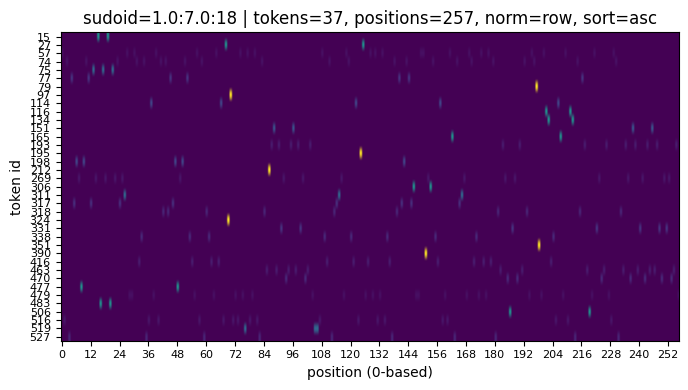

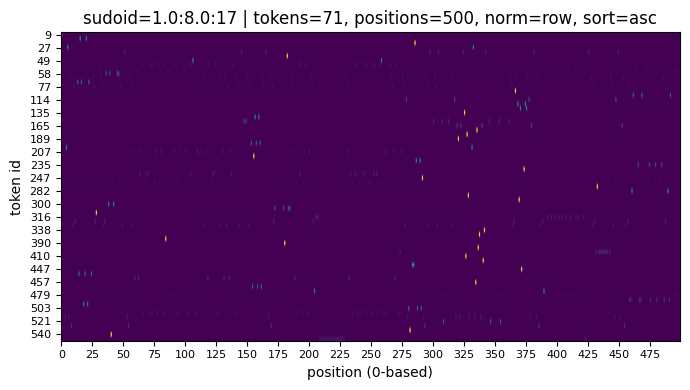

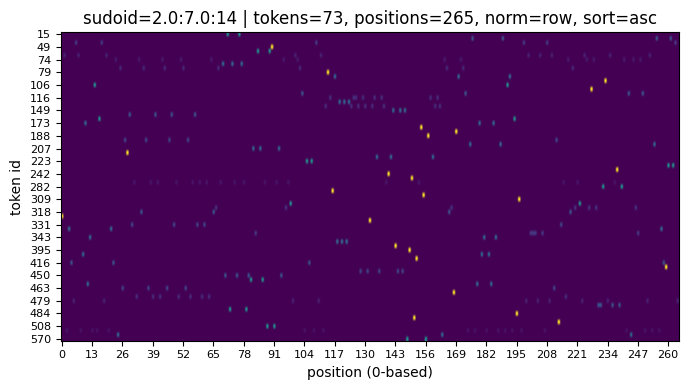

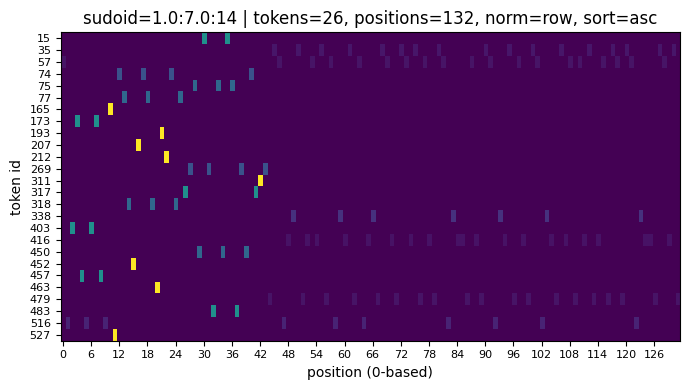

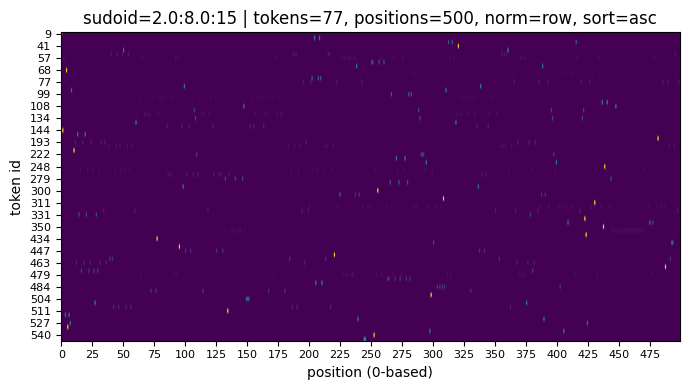

...

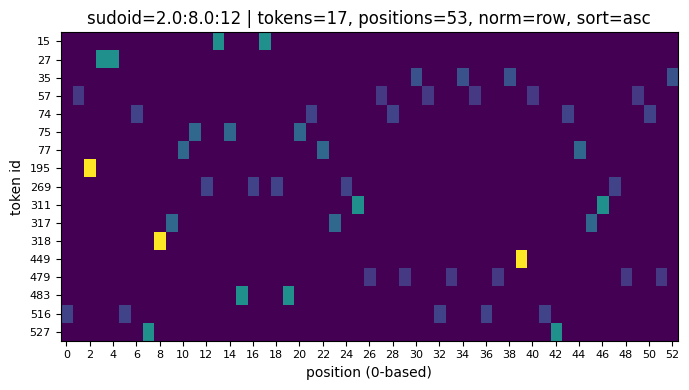

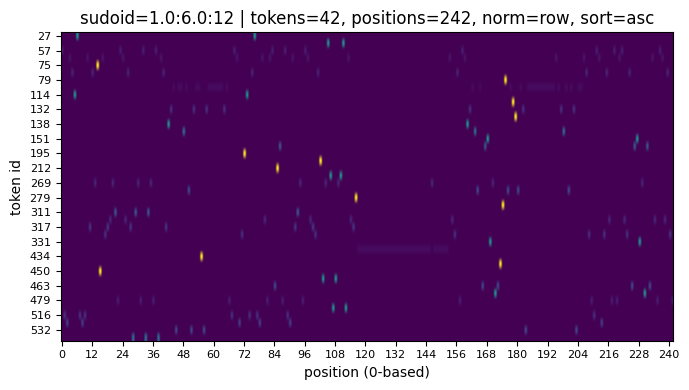

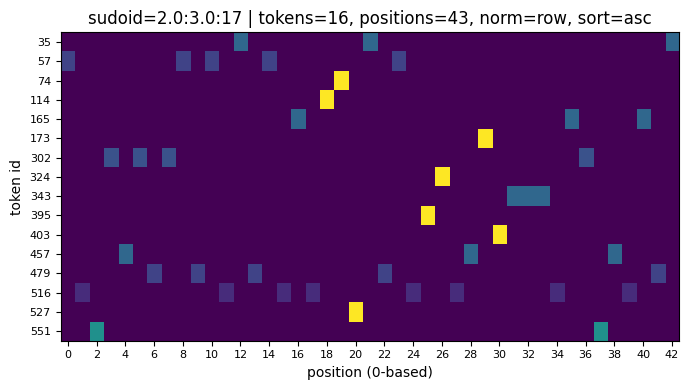

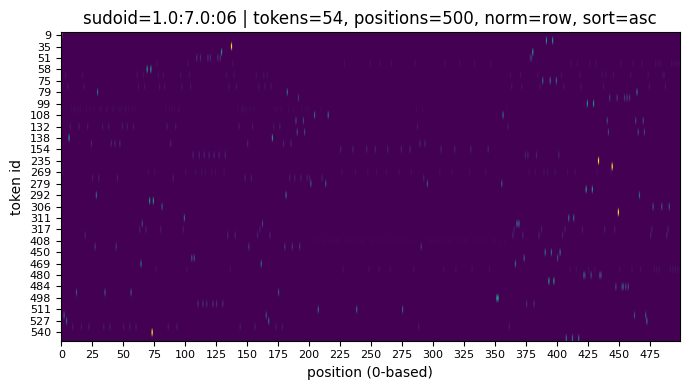

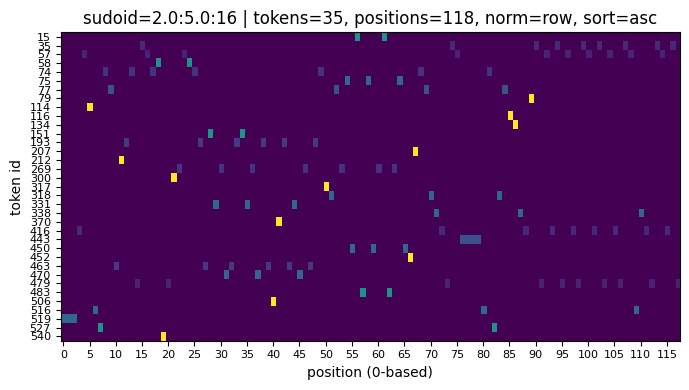

In [56]:
for i in train2.loc[train2['clicked']==1,'sudoid'].head(100).tolist():
  plot_seq_heatmap_single(train2, sudoid=i, seq_col='seq', id_col='sudoid', max_pos=500, top_k=500, normalize='row')

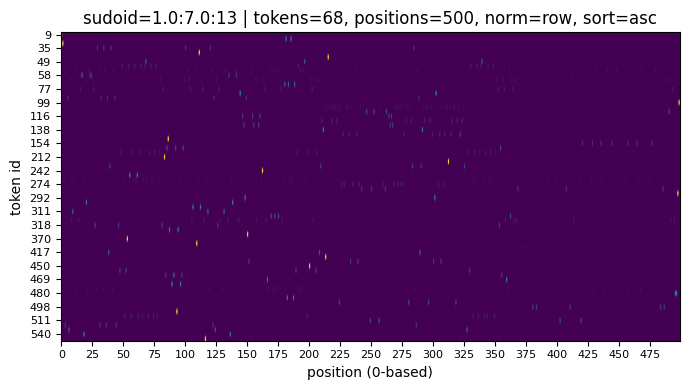

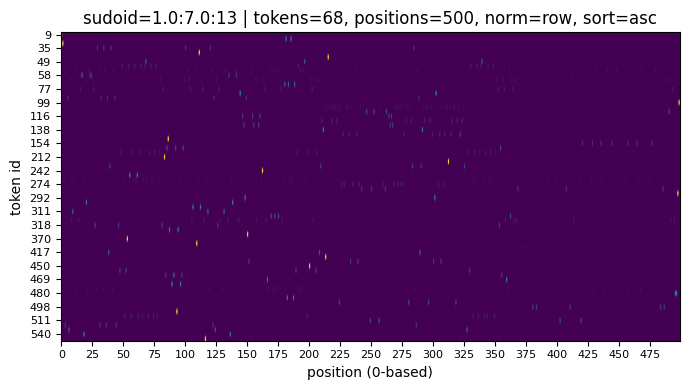

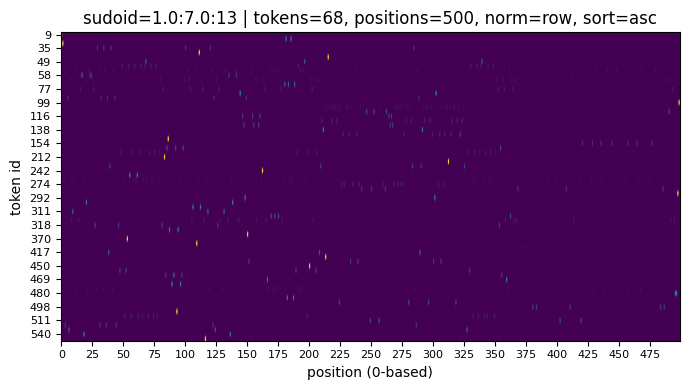

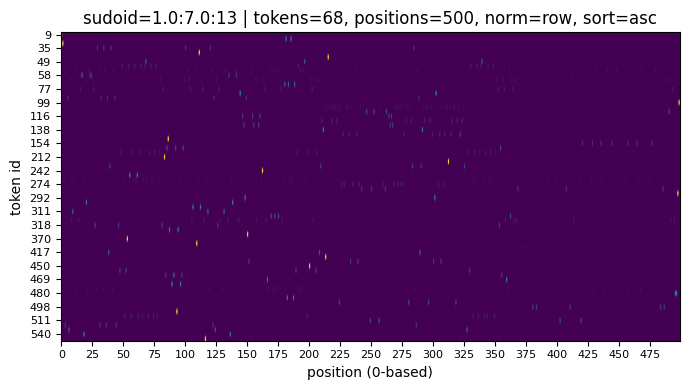

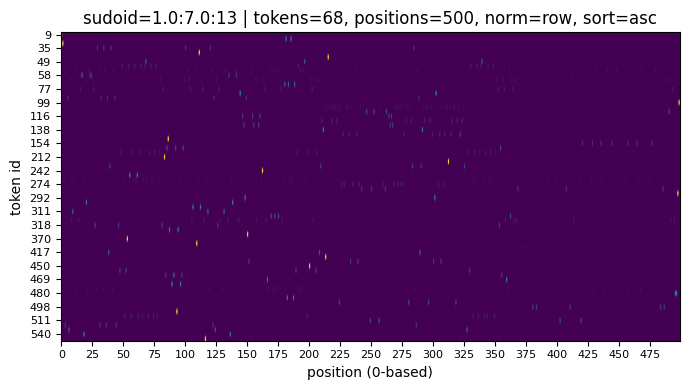

...

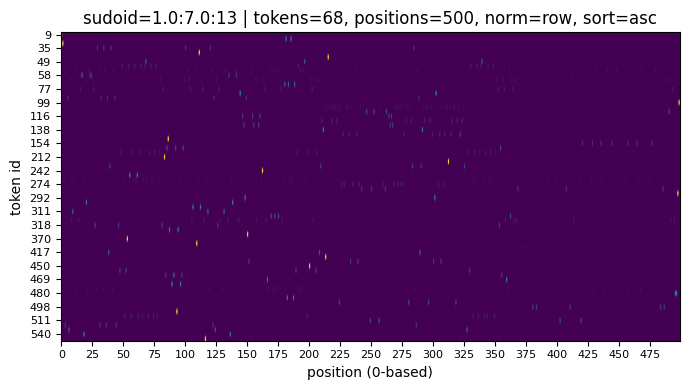

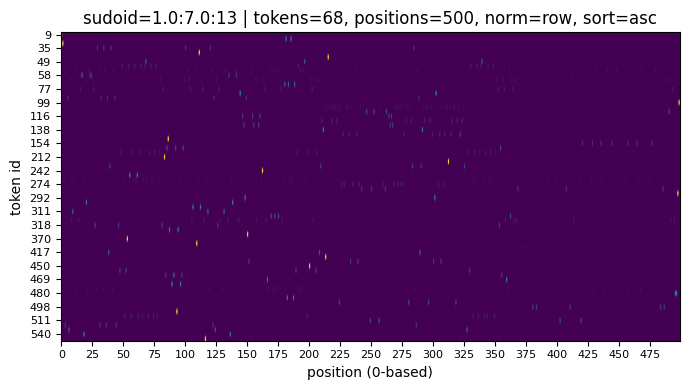

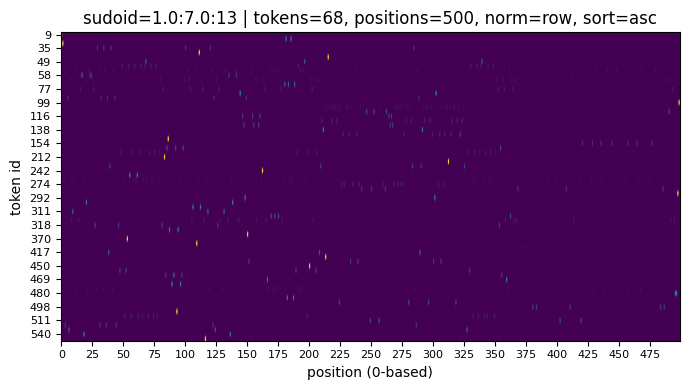

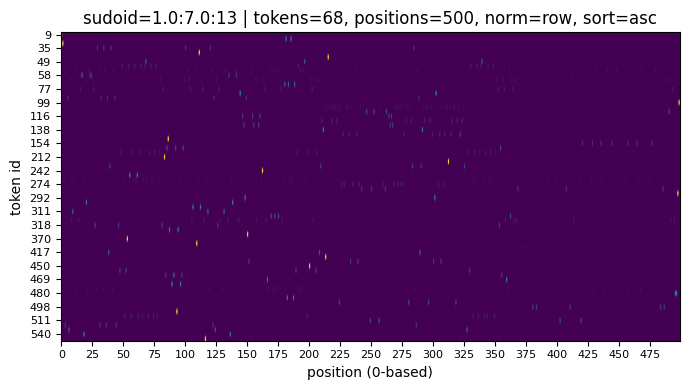

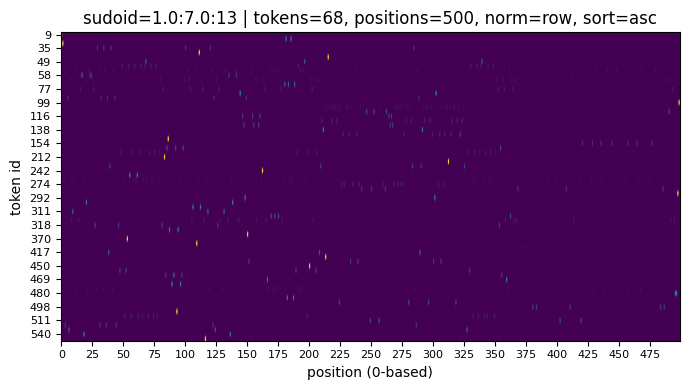

In [55]:
for i in train2.loc[train2['clicked']==0,'sudoid'].head(100).tolist():
  plot_seq_heatmap_single(train2, sudoid='1.0:7.0:13', seq_col='seq', id_col='sudoid', max_pos=500, top_k=500, normalize='row')

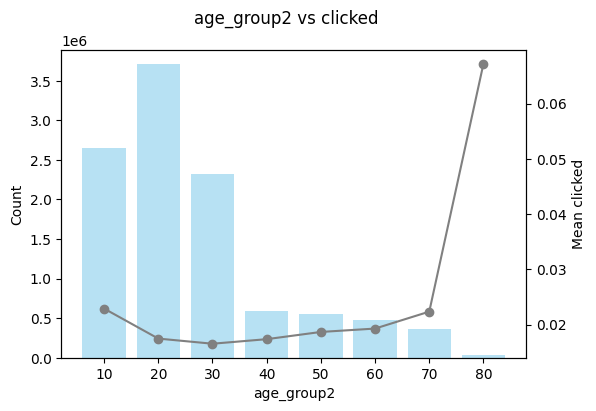

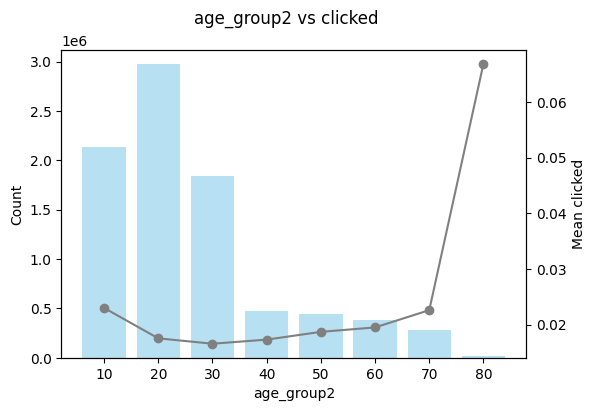

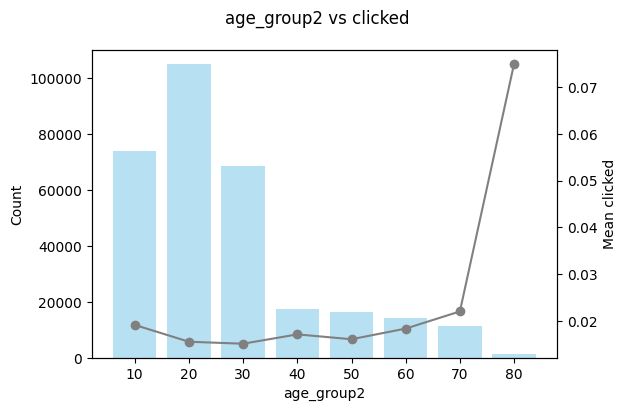

In [17]:
"""
age_group2
"""

age_map = {
    8: "10",
    7: "20",
    6: "30",
    5: "40",
    4: "50",
    3: "60",
    2: "70",
    1: "80"
}
train['age_group2'] = train['age_group'].astype(float).map(age_map)
train2['age_group2'] = train2['age_group'].astype(float).map(age_map)
valid['age_group2'] = valid['age_group'].astype(float).map(age_map)

# check
plot_bar_line(train, group_col='age_group2', target_col='clicked')
plot_bar_line(train2, group_col='age_group2', target_col='clicked')
plot_bar_line(valid, group_col='age_group2', target_col='clicked')

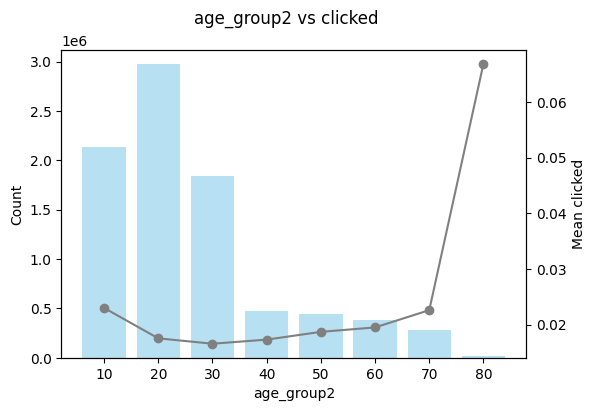

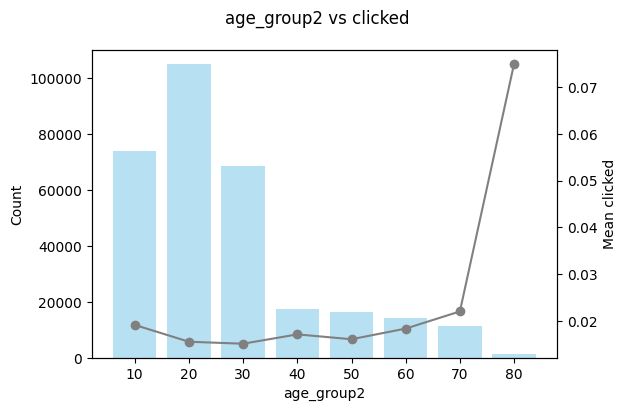

In [18]:
plot_bar_line(train2, group_col='age_group2', target_col='clicked')
plot_bar_line(valid, group_col='age_group2', target_col='clicked')

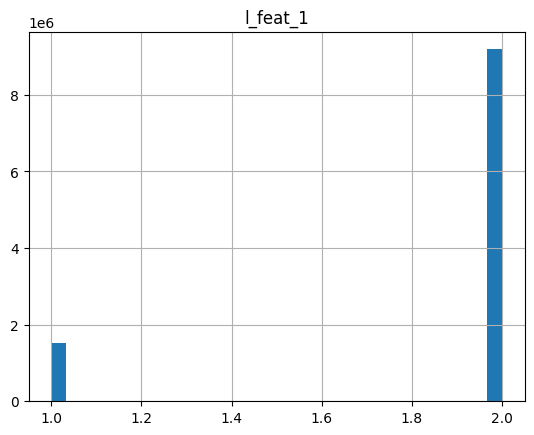

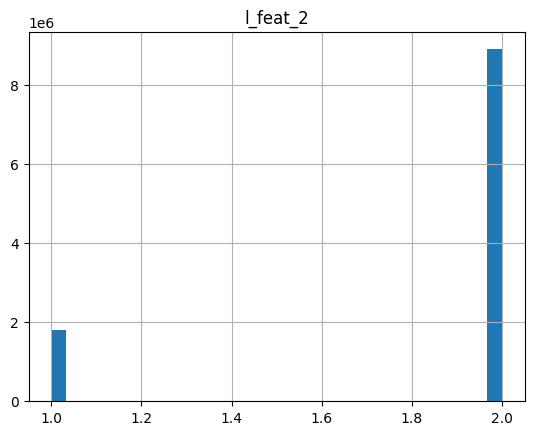

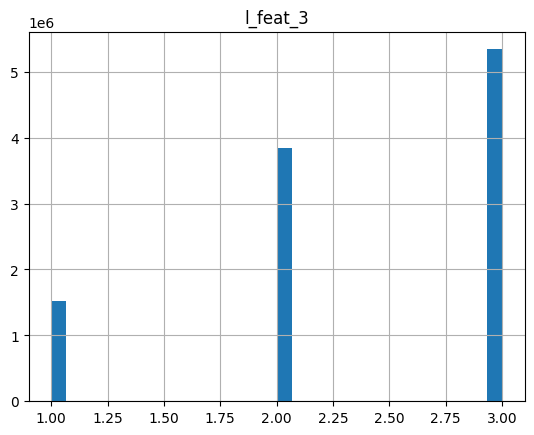

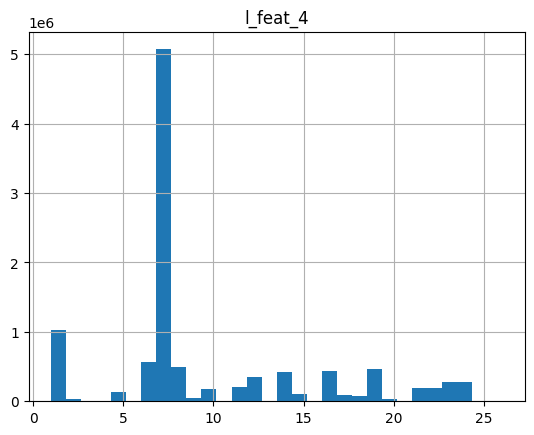

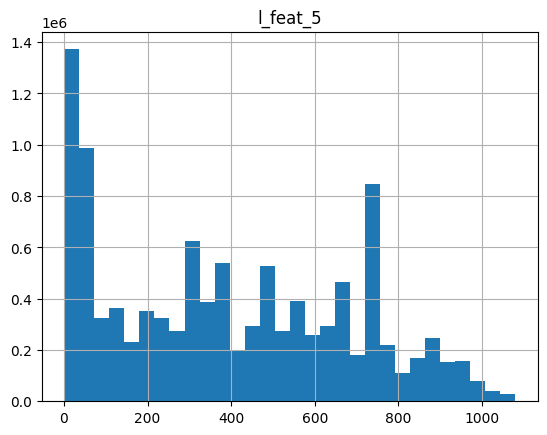

...

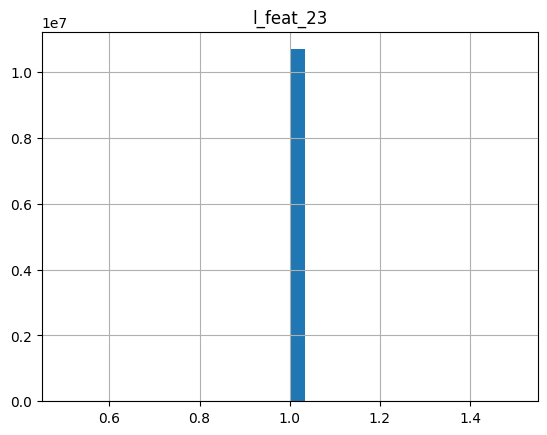

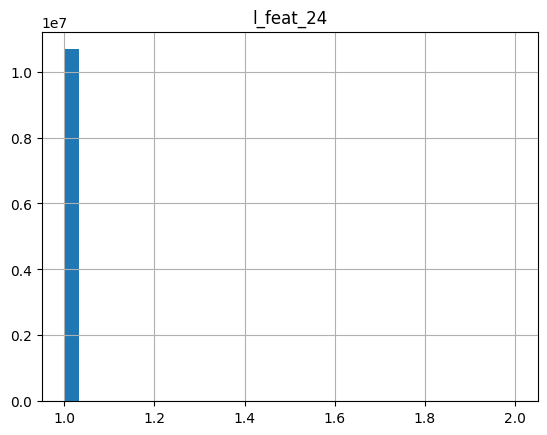

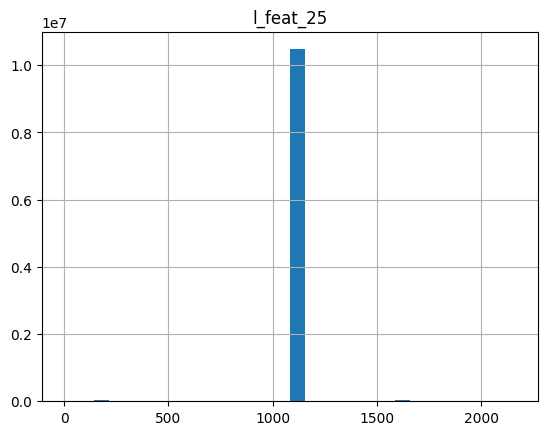

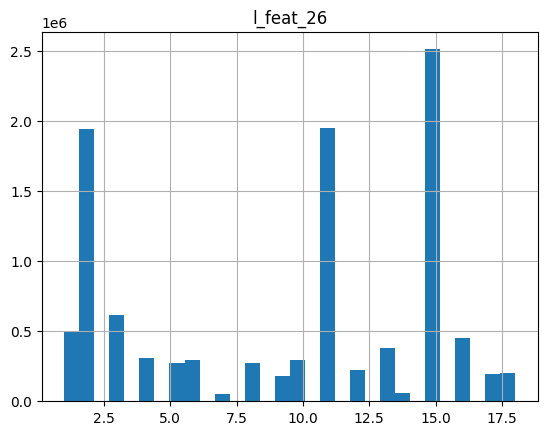

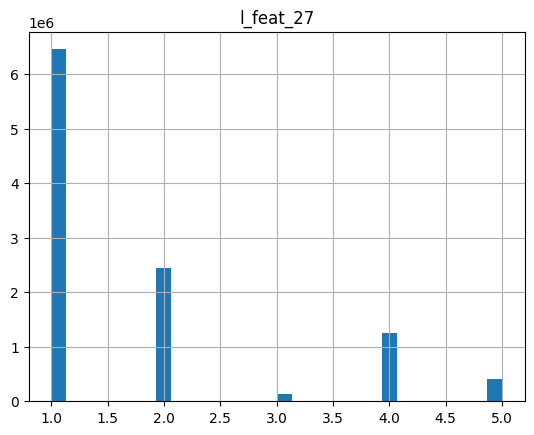

In [22]:
import matplotlib.pyplot as plt

for i in range(1, 28):  # l_feat_1 ~ l_feat_27
    col = f"l_feat_{i}"
    train[col].hist(bins=30)
    plt.title(col)
    plt.show()

### encoding

In [8]:
%%time

"""
Num features: 113 | Cat features: 4
gender unique categories: 3
age_group unique categories: 9
inventory_id unique categories: 18
l_feat_14 unique categories: 3286 # Ads set
CPU times: user 27.9 s, sys: 3.51 s, total: 31.4 s
Wall time: 31.3 s
"""

target_col = "clicked"
seq_col = "seq"
FEATURE_EXCLUDE = {target_col, seq_col, "ID"}
feature_cols = [c for c in train.columns if c not in FEATURE_EXCLUDE]

cat_cols = ["gender", "age_group", "inventory_id", "l_feat_14"]
num_cols = [c for c in feature_cols if c not in cat_cols]
print(f"Num features: {len(num_cols)} | Cat features: {len(cat_cols)}")

train, test, cat_encoders = encode_categoricals(train, test, cat_cols)

Num features: 113 | Cat features: 4
gender unique categories: 3
age_group unique categories: 9
inventory_id unique categories: 18
l_feat_14 unique categories: 3286
CPU times: user 24.4 s, sys: 2.01 s, total: 26.4 s
Wall time: 26.4 s


### train & submit

#### LGB

In [ ]:
# %%time
import os, gc, random
import numpy as np
import polars as pl
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, f1_score

# --------------------------
# 설정
# --------------------------
SEED = 42
TARGET_COL = "clicked"
# 실제 4개 카테고리 컬럼명으로 교체하세요
CAT_COLS = ["gender", "age_group", "inventory_id", "l_feat_14"]

# memmap 저장 경로
MMAP_DIR = "/content/drive/MyDrive/toss/mmap"  # Colab 기준
os.makedirs(MMAP_DIR, exist_ok=True)
XTR_PATH = os.path.join(MMAP_DIR, "X_train.dat")
XTE_PATH = os.path.join(MMAP_DIR, "X_test.dat")
YTR_PATH = os.path.join(MMAP_DIR, "y_train.dat")

# --------------------------
# 시드 고정
# --------------------------
def seed_everything(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)

seed_everything(SEED)

# --------------------------
# (옵션) pandas → polars 변환
# 이미 polars라면 이 블록은 생략하세요.
# --------------------------
if "DataFrame" in str(type(globals().get("train", None))):  # pandas 존재 시
    train_pl = pl.from_pandas(train)
else:
    train_pl = train  # 이미 polars라고 가정
if "DataFrame" in str(type(globals().get("test", None))):
    test_pl = pl.from_pandas(test)
else:
    test_pl = test

# 공통 피처 컬럼
feature_cols = [c for c in train_pl.columns if c != TARGET_COL]
cat_cols_present = [c for c in CAT_COLS if c in feature_cols]
num_cols = [c for c in feature_cols if c not in cat_cols_present]

# --------------------------
# polars: 카테고리 일관 인코딩 + 다운캐스팅
# StringCache로 train/test 같은 코드북 사용
# --------------------------
with pl.StringCache():
    # 1) 카테고리 캐스팅
    if cat_cols_present:
        train_pl = train_pl.with_columns([pl.col(c).cast(pl.Categorical) for c in cat_cols_present])
        test_pl  = test_pl.with_columns([pl.col(c).cast(pl.Categorical) for c in cat_cols_present])

    # 2) 카테고리 -> 코드(Int32), 숫자 -> Float32
    code_expr_tr = []
    code_expr_te = []
    for c in cat_cols_present:
        # to_physical() = 내부 코드(UInt32) → Int32로
        code_expr_tr.append(pl.col(c).to_physical().cast(pl.Int32).alias(c))
        code_expr_te.append(pl.col(c).to_physical().cast(pl.Int32).alias(c))

    cast_num_tr = pl.all().exclude([TARGET_COL] + cat_cols_present).cast(pl.Float32)
    cast_num_te = pl.all().exclude(cat_cols_present).cast(pl.Float32)

    train_pl = train_pl.with_columns([cast_num_tr] + code_expr_tr if cat_cols_present else [cast_num_tr])
    test_pl  = test_pl.with_columns([cast_num_te] + code_expr_te if cat_cols_present else [cast_num_te])

# 라인별 메모리 절약을 위해 확실히 재청크
train_pl = train_pl.rechunk()
test_pl = test_pl.rechunk()

n_train = train_pl.height
n_test  = test_pl.height
n_feat  = len(feature_cols)
print(f"Train: {n_train:,} x {n_feat}, Test: {n_test:,} x {n_feat}")

# --------------------------
# memmap에 X/y 저장 (float32 / int8)
#   - 카테고리 컬럼도 우선 float32로 저장(값은 정수),
#     LightGBM에 categorical_feature 인덱스로 알려줌
# --------------------------
X_train_mm = np.memmap(XTR_PATH, dtype=np.float32, mode="w+", shape=(n_train, n_feat))
X_test_mm  = np.memmap(XTE_PATH, dtype=np.float32, mode="w+", shape=(n_test, n_feat))
y_train_mm = np.memmap(YTR_PATH, dtype=np.int8,   mode="w+", shape=(n_train,))

CHUNK = 1_000_000  # 상황에 맞게 조절

# y 저장
y_train_mm[:] = train_pl.get_column(TARGET_COL).cast(pl.Int8).to_numpy()

# X 저장 (청크)
for start in range(0, n_train, CHUNK):
    end = min(start + CHUNK, n_train)
    X_chunk = train_pl.slice(start, end - start).select(feature_cols).to_numpy()  # float32/Int32->float32
    X_train_mm[start:end] = X_chunk
    del X_chunk
    gc.collect()

for start in range(0, n_test, CHUNK):
    end = min(start + CHUNK, n_test)
    X_chunk = test_pl.slice(start, end - start).select(feature_cols).to_numpy()
    X_test_mm[start:end] = X_chunk
    del X_chunk
    gc.collect()

# memmap re-open (flush)
del X_train_mm, X_test_mm, y_train_mm
X_train = np.memmap(XTR_PATH, dtype=np.float32, mode="r", shape=(n_train, n_feat))
X_test  = np.memmap(XTE_PATH, dtype=np.float32, mode="r", shape=(n_test, n_feat))
y_train = np.memmap(YTR_PATH, dtype=np.int8,   mode="r", shape=(n_train,))

# 카테고리 컬럼 인덱스 (LightGBM에 전달)
cat_idx = [feature_cols.index(c) for c in cat_cols_present]

# --------------------------
# LightGBM GPU 파라미터 (메모리 절약 옵션 포함)
# --------------------------
params = {
    "objective": "binary",
    "metric": "auc",
    "boosting_type": "gbdt",
    "device": "gpu",
    "gpu_platform_id": 0,
    "gpu_device_id": 0,
    "verbosity": -1,
    "learning_rate": 0.05,
    "num_leaves": 64,
    "max_depth": -1,
    "feature_fraction": 0.8,
    "bagging_fraction": 0.8,
    "bagging_freq": 5,

    # 메모리 절약 관련
    "max_bin": 255,                     # 필요 시 127로 더 낮춰 메모리↓
    "bin_construct_sample_cnt": 200000, # 히스토그램 bin 구성 샘플 수 제한
    "force_col_wise": True,             # col-wise 트리 빌드로 메모리↓ (GPU에서도 유효)

    # 재현성
    "seed": SEED,
    "feature_fraction_seed": SEED,
    "bagging_seed": SEED,
    "data_random_seed": SEED,
}

# --------------------------
# Stratified K-Fold
# --------------------------
n_folds = 5
skf = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=SEED)

oof_preds = np.memmap(os.path.join(MMAP_DIR, "oof_preds.dat"),
                      dtype=np.float32, mode="w+", shape=(n_train,))
test_preds = np.zeros(n_test, dtype=np.float32)  # 누적 평균

for fold, (tr_idx, va_idx) in enumerate(skf.split(X_train, y_train)):
    print(f"[Fold {fold+1}] train={len(tr_idx):,}, valid={len(va_idx):,}")

    X_tr = X_train[tr_idx]  # memmap view (복사 최소화)
    y_tr = y_train[tr_idx]
    X_va = X_train[va_idx]
    y_va = y_train[va_idx]

    lgb_train = lgb.Dataset(
        X_tr, label=y_tr, categorical_feature=cat_idx, free_raw_data=True
    )
    lgb_valid = lgb.Dataset(
        X_va, label=y_va, categorical_feature=cat_idx, reference=lgb_train, free_raw_data=True
    )

    model = lgb.train(
        params,
        lgb_train,
        valid_sets=[lgb_train, lgb_valid],
        num_boost_round=2000,
        early_stopping_rounds=100,
        verbose_eval=100
    )

    oof_preds[va_idx] = model.predict(X_va, num_iteration=model.best_iteration)
    # Test 예측 누적
    # (X_test는 memmap이므로 메모리 부담이 적음)
    test_preds += model.predict(X_test, num_iteration=model.best_iteration) / n_folds

    # fold 끝날 때 메모리 정리
    del X_tr, y_tr, X_va, y_va, lgb_train, lgb_valid, model
    gc.collect()

# --------------------------
# 성능 평가
# --------------------------
oof_auc = roc_auc_score(y_train, oof_preds)
oof_f1  = f1_score(y_train, (oof_preds > 0.5).astype(np.int8))

print(f"OOF AUC : {oof_auc:.4f}")
print(f"OOF F1  : {oof_f1:.4f}")
print("OOF Predictions shape:", oof_preds.shape)
print("Test Predictions shape:", test_preds.shape)

#### LSTM

In [ ]:
# %%time

# print("모델 학습 실행")
# model = train_model(
#     train_df=train,
#     num_cols=num_cols,
#     cat_cols=cat_cols,
#     seq_col=seq_col,
#     target_col=target_col,
#     batch_size=CFG['BATCH_SIZE'],
#     epochs=CFG['EPOCHS'],
#     lr=CFG['LEARNING_RATE'],
#     device=device
# )

# print("추론 시작")
# test_dataset = ClickDataset(test, num_cols, cat_cols, seq_col, has_target=False)
# test_loader = DataLoader(test_dataset, batch_size=CFG['BATCH_SIZE'], shuffle=False,
#                          collate_fn=collate_fn_infer, pin_memory=True)
# model.eval()
# outs = []
# with torch.no_grad():
#     for num_x, cat_x, seqs, lens in tqdm(test_loader, desc="[Inference]"):
#         num_x, cat_x, seqs, lens = num_x.to(device), cat_x.to(device), seqs.to(device), lens.to(device)
#         outs.append(torch.sigmoid(model(num_x, cat_x, seqs, lens)).cpu())
# test_preds = torch.cat(outs).numpy()
# print("추론 완료")

# submit = pd.read_csv('./sample_submission.csv')
# submit['clicked'] = test_preds
# submit.to_csv('./test.csv', index=False)
# print("제출 파일 저장 완료")